In [1]:
import cv2 
import os
import matplotlib.pyplot as plt
from numpy import asarray,savetxt,loadtxt
import numpy as np
path = os.getcwd()
from tqdm import tqdm

# changing fps and codex
import ffmpeg
import sys

# it is important to link ourself ffmpeg python to this file otherwise it will not run
sys.path.append(r'C:\\Program Files\\ffmpeg-n4.4-latest-win64-lgpl-4.4\\bin')

verbose = False
verboseprint = print if verbose else lambda *a, **k: None

See results for the first video there : https://drive.google.com/drive/folders/13dLyIqrqQul0PRI5OHjJ4nDpeSrzBlf9?usp=sharing

This first function allows you to read videos

input : 
- n (int) : number of the video (from 1 to 100)
output:
- object from cv2

In [2]:
def load_video(n):
    # put your path to the video folder
    path_video = "C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\all_videos"
    if n<10:
        vs = cv2.VideoCapture(path_video+f"\\0000{n}.mp4")
    elif n<100:
        vs = cv2.VideoCapture(path_video+f"\\000{n}.mp4")
    elif n==100:
        vs = cv2.VideoCapture(path_video+f"\\00{n}.mp4")
    else:
        print(f"Video {n} not available")
    return vs

This cell allows to go through all the videos by calculating the difference between the consecutive histograms. The distance used is the Manhattan distance.

$d(x_i,y_i) = \sum |x_i-y_i|$

In [3]:
with_reload = False
if with_reload:
    distances = []
    for n in range(1,101):
        vs = load_video(n)
        histPrev = np.zeros((64,1))
        while True :
            # grab a frame from the video
            (grabbed, frame) = vs.read()
            # if the frame is None, then we have reached the end of the
            # video file

            if frame is None:
                verboseprint("End of the video")
                break

            frameg= cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

            histCurr= cv2.calcHist(images=[frameg], 
                                       channels=[0], 
                                       mask=None, 
                                       histSize =[64], 
                                       ranges=[0,64])

            distance = np.sum(np.abs(histPrev - histCurr))
            distances.append(distance)
            histPrev = histCurr

        print(n)
    os.chdir("C:\\Users\\baptc\\Documents\\computer_vision\\project_videos")
    np.save('distances.npy', distances)    # .npy extension is added if not given
else:
    # path with the folder with distances.npy given with the project
    distances = np.load('C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\distances.npy')

This is our own shot detection algorithm. This function uses the Twin-Comparison approach. Thus, two thresholds have to be defined. There are also additional inputs for the minimum direction of a scene.

input :
- n : video number
- thresholdDown : lower threshold
- thresholdUp : upper threshold
- BINS : number of e bins
- minBtwCut : minimum number of frames in a scene
- withPlot : display or not a graph with the differences between histograms
- withSave : if you want to save the result

output:
- integer list including the indexes of the frames being considered as cut

In [4]:
# loop over the frames of the video

def ShotDetection(n,thresholdDown,thresholdUp,BINS = 64, minBtwCut=20, withPlot=False,withSave=False):  
    vs = load_video(n)
    histPrev = np.zeros((BINS,1))
    cuts = [0]
    i = 0
    j = 0
    distanceAccumulation = 0
    while True :
        # grab a frame from the video
        (grabbed, frame) = vs.read()
        # if the frame is None, then we have reached the end of the
        # video file
    
        if frame is None:
            break
        orig = frame.copy()
        frameg= cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
                
        histCurr= cv2.calcHist(images=[frameg], 
                                   channels=[0], 
                                   mask=None, 
                                   histSize =[BINS], 
                                   ranges=[0,BINS])

        distance = sum(np.abs(histPrev - histCurr))
        
        if distance - thresholdDown > 0: 
            distanceAccumulation += distance - thresholdDown
        else:
            distanceAccumulation = 0
        
        
        if((distanceAccumulation > thresholdUp) and (j>minBtwCut)):
            if withPlot:
                plt.imshow(orig)
                plt.show()
            if withSave:
                cv2.imwrite(path_folder+f'\\frame_{i}.png', frame)
            distanceAccumulation = 0
            j=0
            cuts.append(i)
        
        histPrev = histCurr
        i+=1
        j+=1
    cuts.append(i)
    return cuts

Here we define the thresholds from the cell that calculates the distances between all histograms for all videos.

The thresholds are defined from the entirety of all the videos.

In [5]:
thresholds = np.quantile(np.array(distances), [0.90,0.95])
thresholdDown = thresholds[0]
thresholdUp = thresholds[1]

## example

If you want to visulize you have to change the path to the video in the function $\textbf{load_video}$ and also the path to distances.npy to the distances between all the frame in the cell (3) above

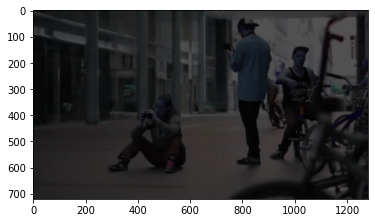

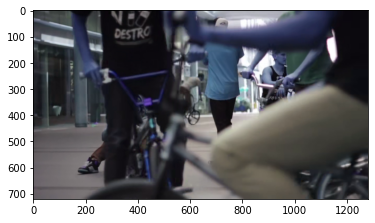

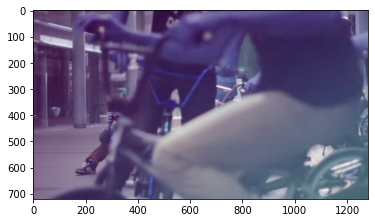

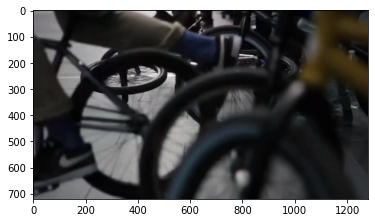

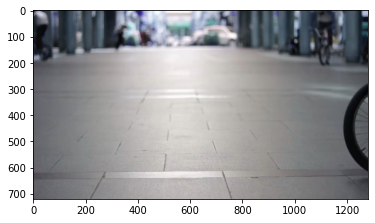

...

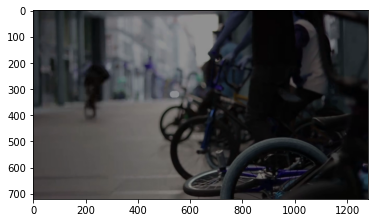

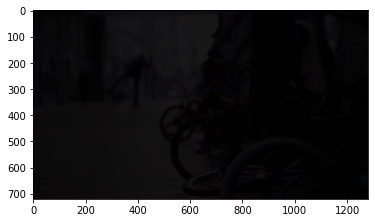

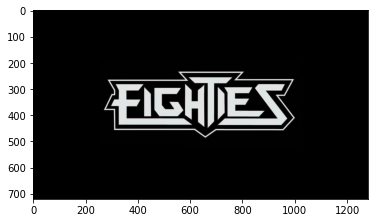

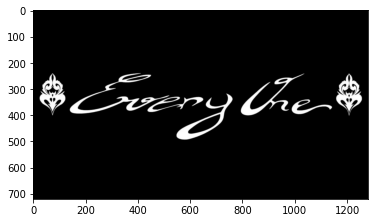

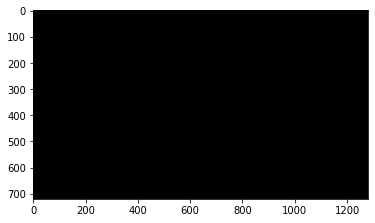

[0,
 21,
 120,
 141,
 162,
 200,
 259,
 289,
 326,
 372,
 394,
 473,
 528,
 639,
 660,
 681,
 702,
 723,
 755,
 840,
 864,
 886,
 909,
 931,
 952,
 1064,
 1159,
 1183,
 1206,
 1449,
 1474,
 1495,
 1526,
 1808,
 1873,
 1894,
 1937,
 2055,
 2088,
 2110,
 2467,
 2716,
 2737,
 2762,
 2883,
 2904,
 2925,
 2956,
 2983,
 3330,
 3601,
 3622,
 3643,
 3685,
 3706,
 4047,
 4068,
 4089,
 4116,
 4137,
 4286,
 4307,
 4328,
 4354,
 4375,
 4400,
 4422,
 4443,
 4486,
 4991,
 5015,
 5111,
 5176,
 5271,
 5439,
 5571,
 5740,
 5761,
 5782,
 6081,
 6118,
 6174,
 6196,
 6217,
 6262,
 6292,
 6316,
 6343,
 6475,
 6496,
 6665,
 6689,
 6712,
 6824]

In [6]:
ShotDetection(1,thresholdDown,thresholdUp,BINS = 64, minBtwCut=20, withPlot=True, withSave=False)

## for importing

We have the list of frame numbers that are considered as cuts. We will now use the indices to return the scenes (video extracts between two cuts). It will take all the frame between to frame considered as cut and create a video. The way we found is to use .avi. It take more space than .mp4. So we will change the codec after

input :

- n : video number
- thresholdDown : lower threshold
- thresholdUp : upper threshold

In [7]:
def video_save(n, thresholdDown, thresholdUp):
    os.chdir("C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split")
    cuts = ShotDetection(n,thresholdDown,thresholdUp,64,50,False,False)
    
    segRange = [(cuts[i],cuts[j]) for i,j in zip(range(0,len(cuts)-1),range(1,len(cuts)))]
    path_video = "C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\all_videos"
    if n<10:
        os.makedirs(f"video_split_0000{n}")
        path_folder = os.getcwd()+f"\\video_split_0000{n}"
        vidPath = path_video+f"\\0000{n}.mp4"
        
    elif n<100:
        os.makedirs(f"video_split_000{n}")
        path_folder = os.getcwd()+f"\\video_split_000{n}"
        vidPath = path_video+f"\\000{n}.mp4"
        
    elif n==100:
        os.makedirs(f"video_split_00{n}")
        path_folder = os.getcwd()+f"\\video_split_00{n}"
        vidPath = path_video+f"\\00{n}.mp4"

    os.chdir(path_folder)
    shotsPath = 'video_%d.avi' # output path (must be avi, otherwize choose other codecs)
     # a list of starting/ending frame indices pairs
    
    cap = cv2.VideoCapture(vidPath)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    size = (int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)),int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)))
    fourcc = int(cv2.VideoWriter_fourcc('X','V','I','D')) # XVID codecs

    for idx,(begFidx,endFidx) in enumerate(segRange):
        writer = cv2.VideoWriter(shotsPath%idx,fourcc,fps,size)
        cap.set(cv2.CAP_PROP_POS_FRAMES,begFidx)
        ret = True # has frame returned
        while(cap.isOpened() and ret and writer.isOpened()):
            ret, frame = cap.read()
            frame_number = cap.get(cv2.CAP_PROP_POS_FRAMES) - 1
            if frame_number < endFidx:
                writer.write(frame)
            else:
                break
        writer.release()

execution of the function that separates each video into scenes

In [8]:
with_reload = False
if with_reload:
    for n in tqdm(range(81,101)):
        video_save(n,thresholdDown,thresholdUp)

# conversion avi to mp4

This part is used to convert videos from .avi to .mp4 format using the ffmpeg library

The .avi videos took too much space in memory and were complicated to send because we were working remotely.

We wanted two types of format:

- reduction of the result to 640x360 .mp4. These videos were then used for our application. This choice was made for simplicity of exchange. Moreover, the resolution proposed is correct compared to the 1280x720 format.

- The original 1280x720 format but reduced to 4 fps. These scenes were used for key frame extraction. We wanted to keep a good quality.

This function allows you to choose the fps, the dimensions of the output videos.

input :

- n: video number
- name_out : name video output
- w : width
- h : height
- fps : number frame per second

In [9]:
def save_change_quality_format(n,name_out,w,h,fps):
    
    os.chdir(f"C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split_mp4\\{name_out}")
    if n<10:
        list_path_video = os.listdir(f"C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split\\video_split_0000{n}")
        os.makedirs(f"video_split_0000{n}")
        os.chdir(f"C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split_mp4\\{name_out}\\video_split_0000{n}")

    elif n<100:
        list_path_video = os.listdir(f"C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split\\video_split_000{n}")
        os.makedirs(f"video_split_000{n}")
        os.chdir(f"C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split_mp4\\{name_out}\\video_split_000{n}")

    else :
        list_path_video = os.listdir(f"C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split\\video_split_00{n}")
        os.makedirs(f"video_split_00{n}")
        os.chdir(f"C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split_mp4\\{name_out}\\video_split_00{n}")
    
    
    for video_path in list_path_video :
        if n<10:
            stream = ffmpeg.input(f"C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split\\video_split_0000{n}\\"+video_path)
        elif n<100:
            stream = ffmpeg.input(f"C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split\\video_split_000{n}\\"+video_path)
        else :
            stream = ffmpeg.input(f"C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split\\video_split_00{n}\\"+video_path)
        #stream = stream.trim(start = 0,duration = 2)
        # stream.filter('fps',fps = 10,round='up').filter('scale',w=640,h=360)
        if w is None:
            stream = stream.filter('fps',fps = fps,round='up')
            stream = ffmpeg.output(stream,video_path.split(".")[0]+'.mp4')
            ffmpeg.run(stream)
        else:
            stream = stream.filter('fps',round='up').filter('scale',w=w,h=h)
            stream = ffmpeg.output(stream,video_path.split(".")[0]+'.mp4')
            ffmpeg.run(stream)

for the key frame extraction

In [10]:
with_ = False
if with_:
        w = None
        h = None
        fps = 4
        name_out = f"size_actual"
        os.chdir(f"C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split_mp4")

        os.makedirs(name_out)
        for i in range(1,101):
            save_change_quality_format(i,name_out,w,h,fps)

for the video application 

In [11]:
with_ = False
if with_:
    w = 640
    h = 360
    fps = 4
    name_out = f"size_{w}_{h}"
    os.chdir(f"C:\\Users\\baptc\\Documents\\computer_vision\\project_videos\\video_split_mp4")

    os.makedirs(name_out)
    for i in range(1,101):
        save_change_quality_format(i,name_out,w,h,fps)